In [1]:
%reset -f
from helpers import *
%matplotlib inline
# import warnings
# warnings.filterwarnings("ignore")


/homes/willj/anaconda3/envs/AZ/lib/python3.5/site-packages/sklearn/cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)
Using TensorFlow backend.


# Introduction and Data preprocessing

We entered a colloration with AstraZeneca from June 2016 - December 2016. AstraZeneca conducts internal drug trials to investigate biological targets that are present in disease. The purpose is to search for compounds that modulate these biological targets. This process is known as High Content Screening (HCS).

From a particular High Content Screen conducted last year, the group within AstraZeneca measured the phenotype by taking microscopy images of the assays at intermediate points. They would like to investigate whether machine learning methods, which have broken records in performance computer vision and speech recognition, can identify drugs that would successfully pass later stages of the drug trial, specifically one which passed stage 3, using these intermediate microscopy images.

Stage 1 involved a a basic green fluorescence detection, Stage 2 and 3 involved counter screens, and stage 4 involved extensive laboratory tests. As shown below, approximately 1.7 million potential candidate drugs were included at the start of the trial, ~13000 passed Stage 1, ~3000 passed Stage 2, ~1000 passed Stage 3 and only 30 successfully passed Stage 4.

The task reduces to a binary classification problem, **positive drugs** are drug that pass Stage 3, and **negative drugs** negative drugs are those that do not pass to Stage 3.

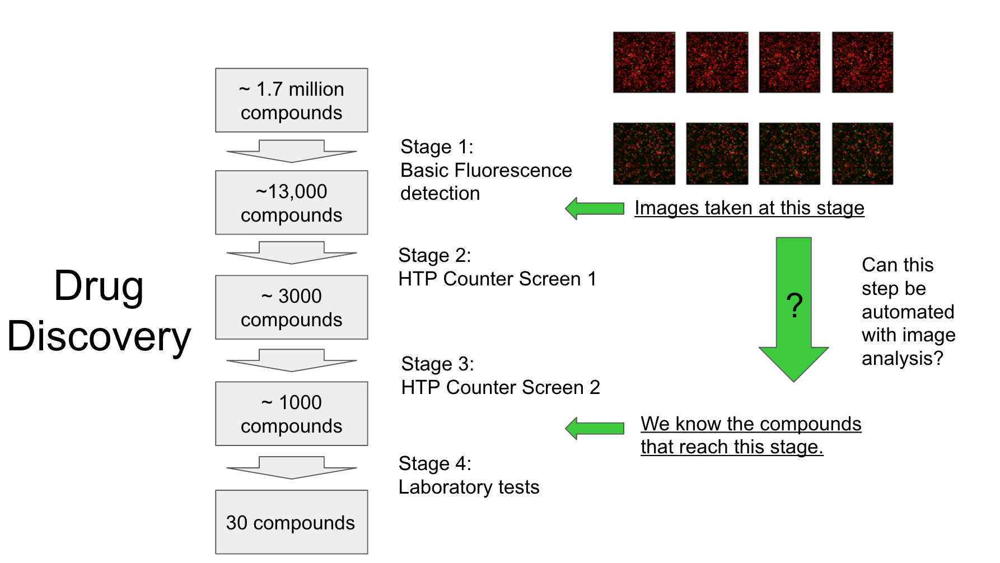

In [3]:
Image(filename='diagrams/DrugTrialflowchart.png') 

In the high content screen, each drug was administered to the cells within a well. 4 images were taken of each well, one for each quadrant, and each image has a red and a green channel. The red channel identifies cell nuclei, and the green channel identifies the GFP tagged antigen. Each well contained a different drug, and so we give each drug an ID which refers to the the plate and well it was located in. In each plate there are many wells each with different well IDs, but across different plates there are wells with the same well ID. Therefore the combination of plate ID and well ID is required to give unique drug IDs. The drug IDs take the form of *plateID*_*wellID*, for example: 1053919905_A07.

We received the microsopy images of this drug trial that were taken after stage 1. We received these images in two batches, called Controls and IXData. The Control images we received on ? and the IXData we received on ?.

In the Control batch, we were given labels for which drug reached stage 3 successfully and which had not. We recieved images for {{len(positive_control_IDs)}} positive drugs and {{len(negative_control_IDs)}} negative drugs.

In the IXData batch, we received clean images for {{len(IXimage_IDs)}} drugs. We also received a list of {{len(IXpositiveIDs)}} positive IDs that successfully passed stage 3. Of this set, there existed images for {{len(valid_positiveIDs)}}. Therefore in total we have 987 positive drugs and 16174 negative drugs



# Control Dataset

## Positive Controls

### Full Images

Displayed below are 3 example images from the positive controls.

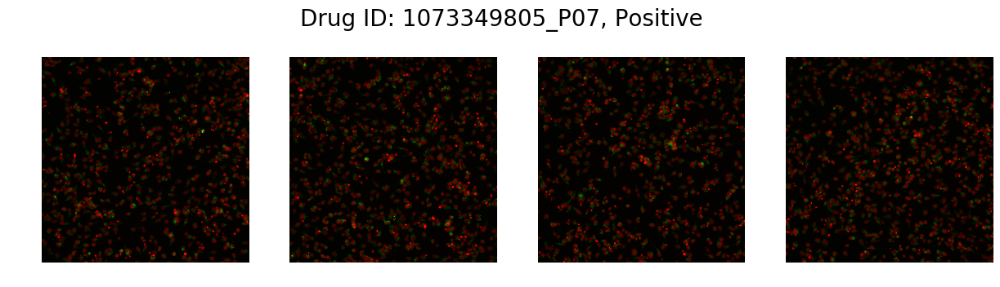

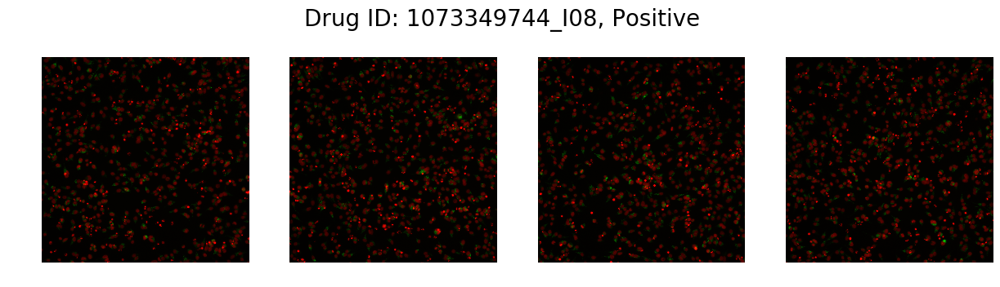

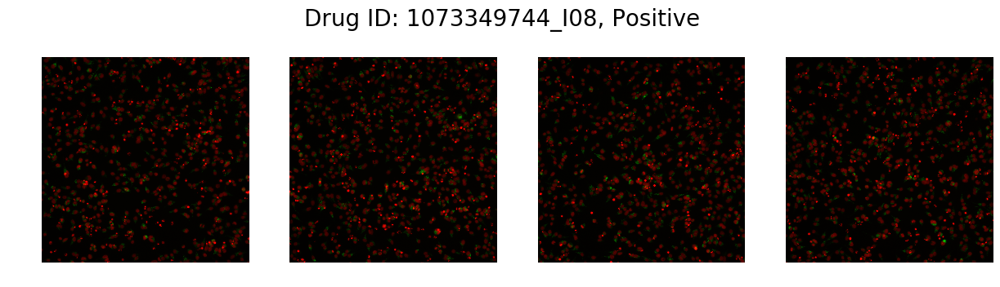

In [17]:
positive_random_choice = np.random.choice(positive_control_IDs,3)
for ID in positive_random_choice:
    a = Assay(ID, 'processed/CleanPositiveControls/')
    a.display()

### Zoomed

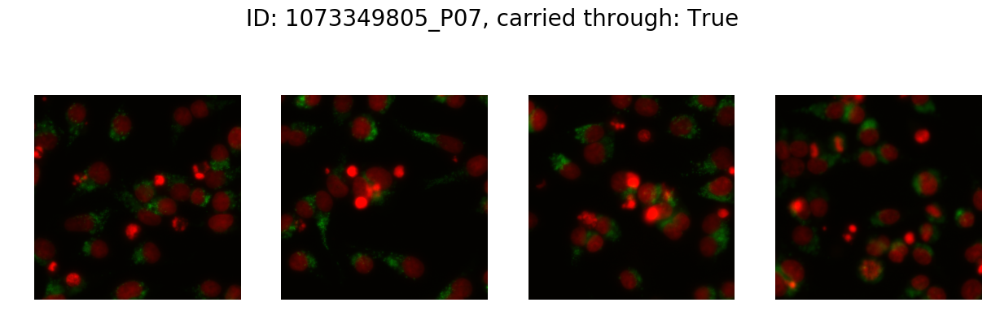

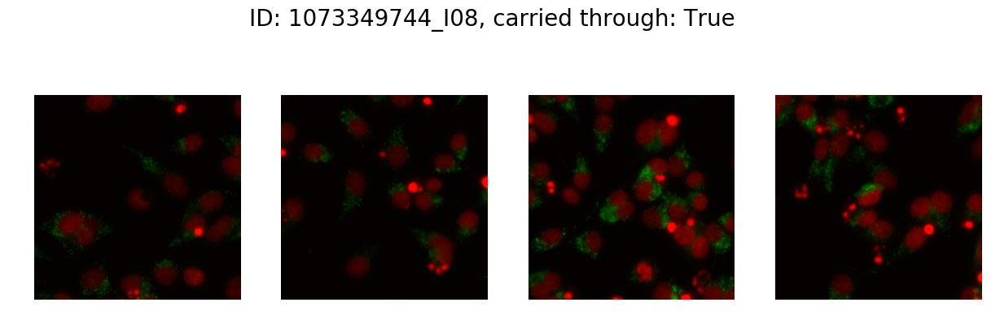

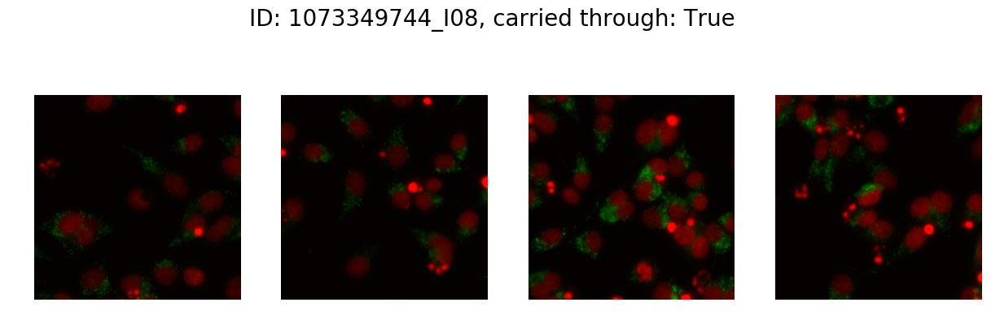

In [18]:
for ID in positive_random_choice:
    a = Assay(ID, 'processed/CleanPositiveControls/')
    a.display_sections(400)

## Negative Controls

Below displays 3 example full images from the negative controls. Below those, the images is zoomed to the central 400 pixels.

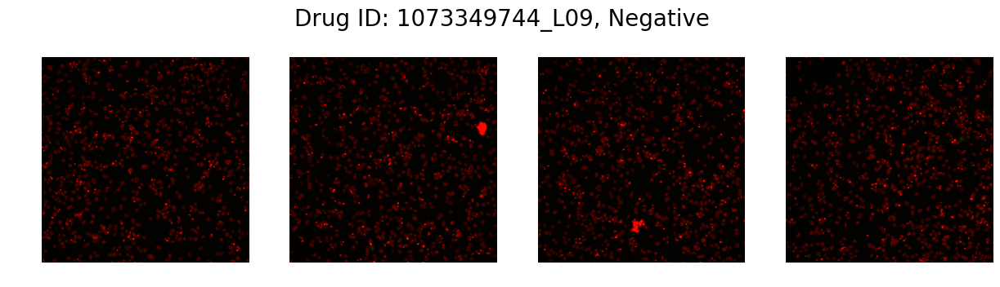

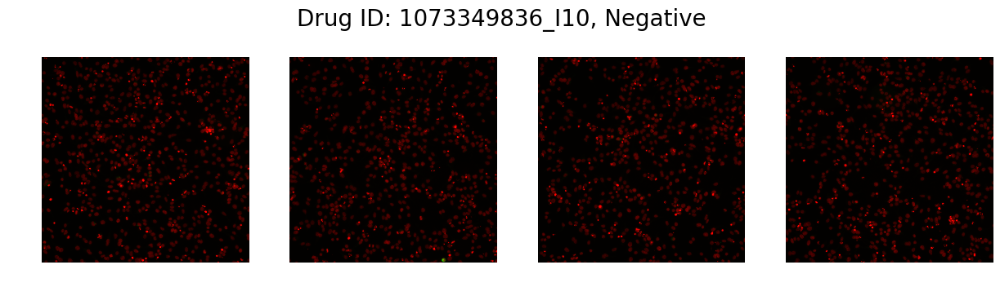

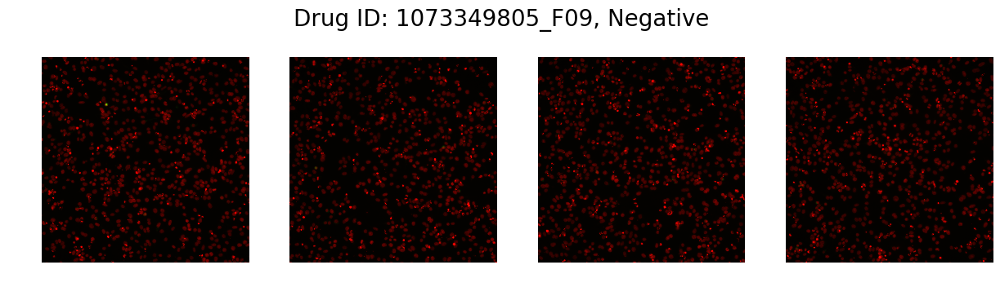

In [2]:
negative_random_choice = np.random.choice(negative_control_IDs,3)
for ID in np.random.choice(negative_control_IDs,3):
    a = Assay(ID, 'processed/CleanNegativeControls/')
    a.display()

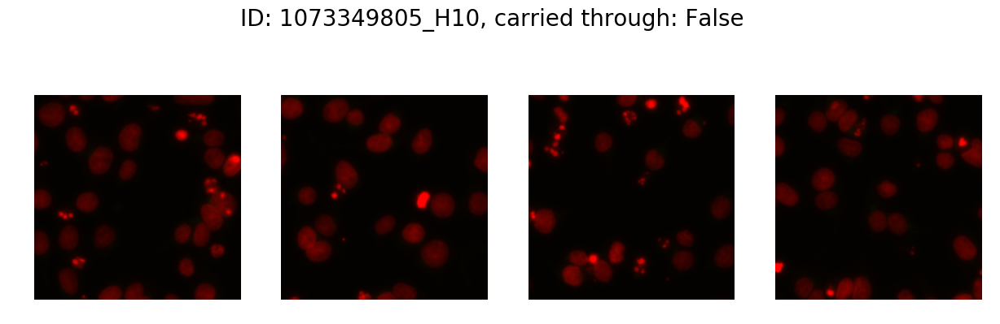

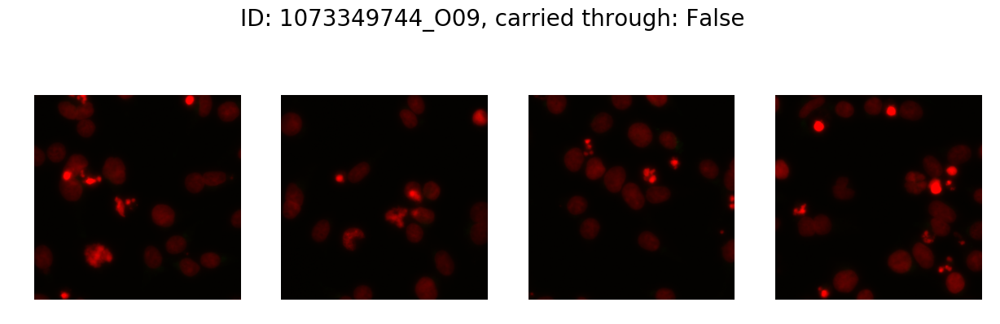

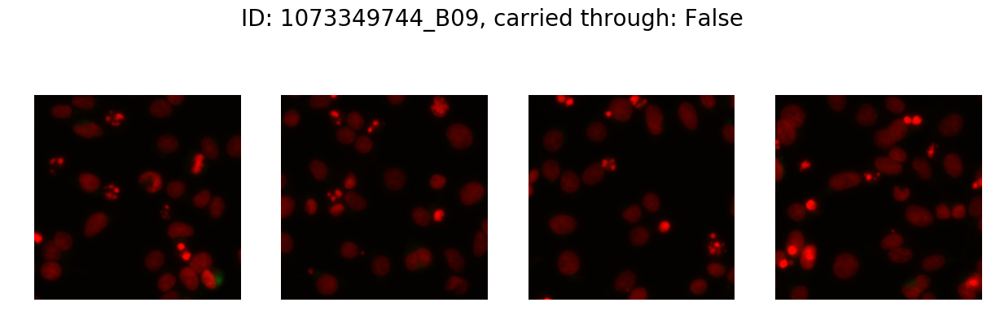

In [3]:
for ID in negative_random_choice:
    a = Assay(ID, 'processed/CleanNegativeControls/')
    a.display_sections(400)

# Mean pixel analysis on Control

Presence or absence of green seemed to be a strong indicator of probability of being carried through. To test this we plotted average pixel intensities across 4 replicates.

In [37]:
def display_pixel_cluster(mean_pixel_dict_controls):
    pixels_intensity_labels = [(mean_pixel_dict_controls[ID][0], mean_pixel_dict_controls[ID][1], ID in total_valid_postiveIDs) for ID in mean_pixel_dict_controls]

    pixel_positive_labels = [x[0:2] for x in pixels_intensity_labels if x[-1] == True]
    pixel_negative_labels = [x[0:2] for x in pixels_intensity_labels if x[-1] == False]

    plt.title('Mean pixel intensity on red and green channels')
    plt.scatter([x[0] for x in pixel_negative_labels],[x[1] for x in pixel_negative_labels], color='red', label='Negative Controls',alpha=0.5,s=1)
    plt.scatter([x[0] for x in pixel_positive_labels],[x[1] for x in pixel_positive_labels], color='blue', label='Positive Controls',alpha=0.5,s=1)
    plt.legend(loc='upper right')
    plt.xlabel('red channel',size=15)
    plt.ylabel('green channel',size=15)

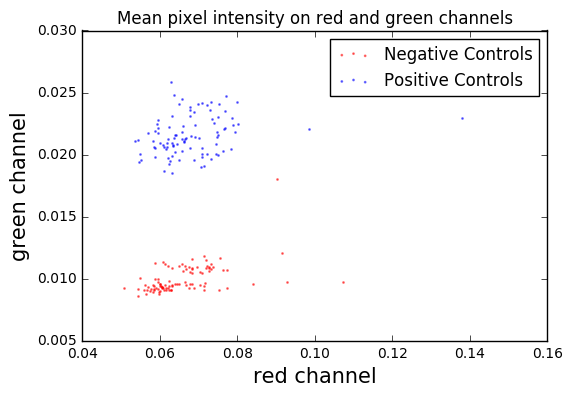

In [38]:
mean_pixel_dict_controls = generate_mean_pixel_intensities_for_controls()
display_pixel_cluster(mean_pixel_dict_controls)
# CLASSES ARE SEPERABLE

These are clearly seperable. The assays that are carried through tend to have a higher mean pixel intensity on the green channel.

# IXClean

Now we run the same analysis on the second, larger dataset. We investigate how seperable the classes are using pixel intensity. We display the full image, as well as zooming to the 400x400 central square.

## Positive examples 

### Full images

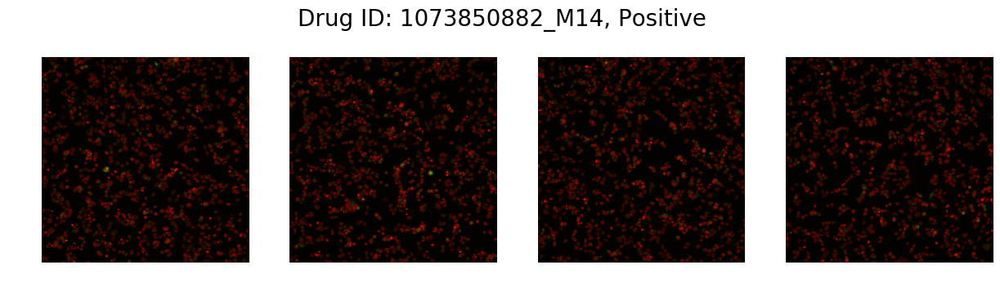

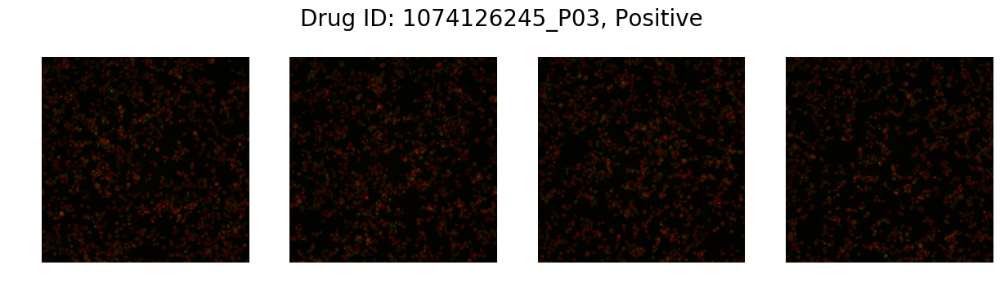

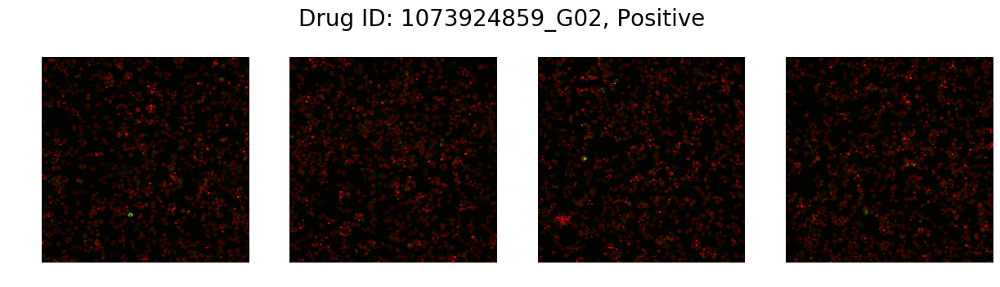

In [14]:
positive_random_choice = np.random.choice(valid_positiveIDs,3)
for ID in positive_random_choice:
    a = Assay(ID, 'processed/IXClean/')
    a.display()

### Zoomed

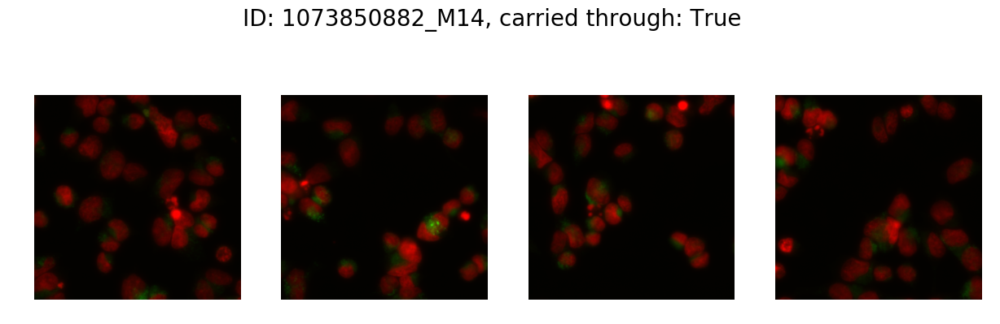

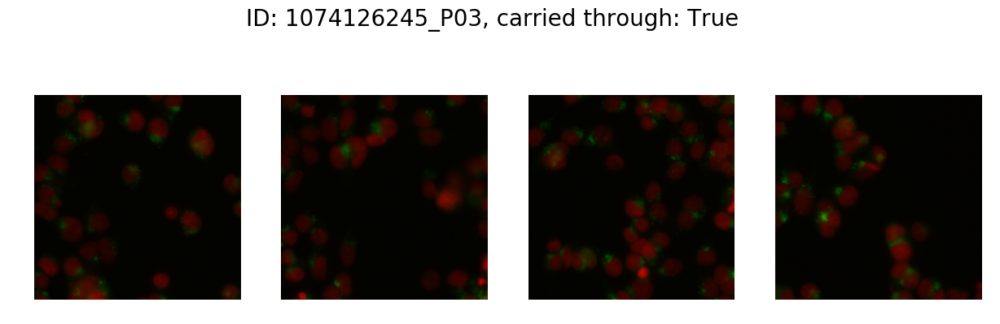

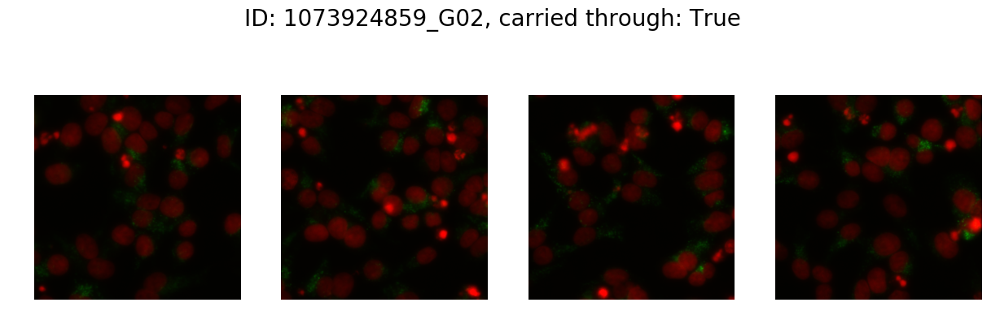

In [15]:
for ID in positive_random_choice:
    a = Assay(ID, 'processed/IXClean/')
    a.display_sections(400)

## Negative examples

### Full images

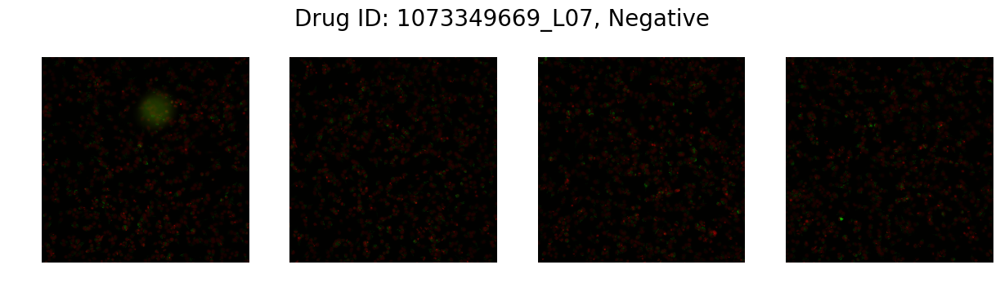

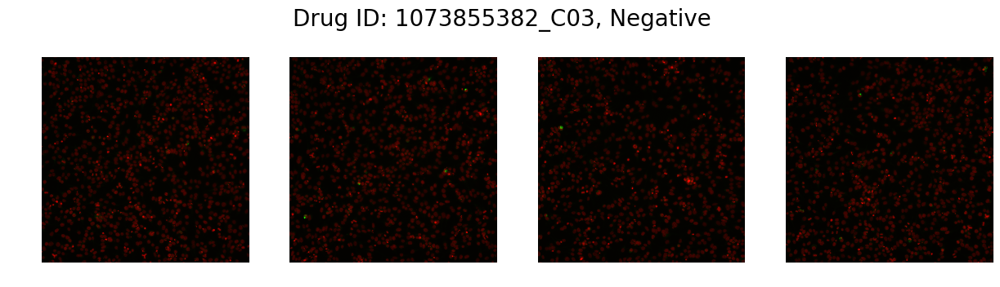

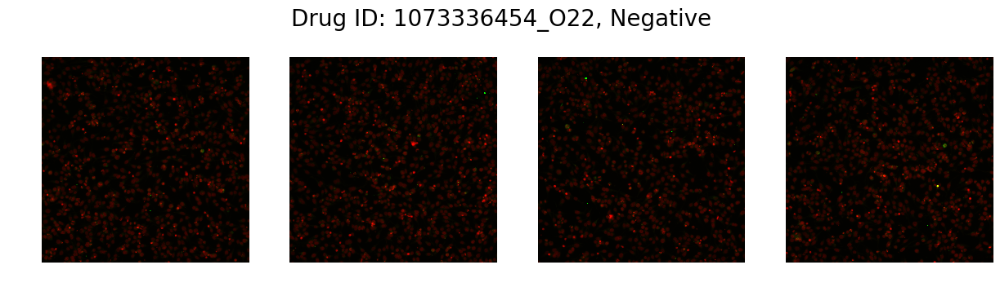

In [16]:
negative_random_choice = np.random.choice(IXnegativeIDs,3)
for ID in np.random.choice(IXnegativeIDs,3):
    a = Assay(ID, 'processed/IXClean/')
    a.display()

### Zoomed

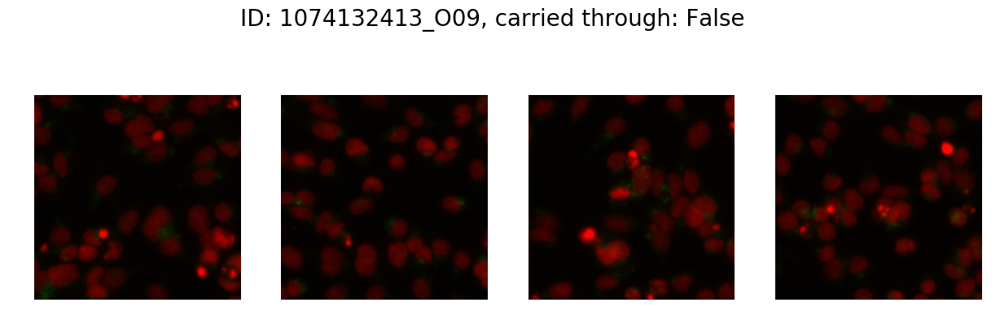

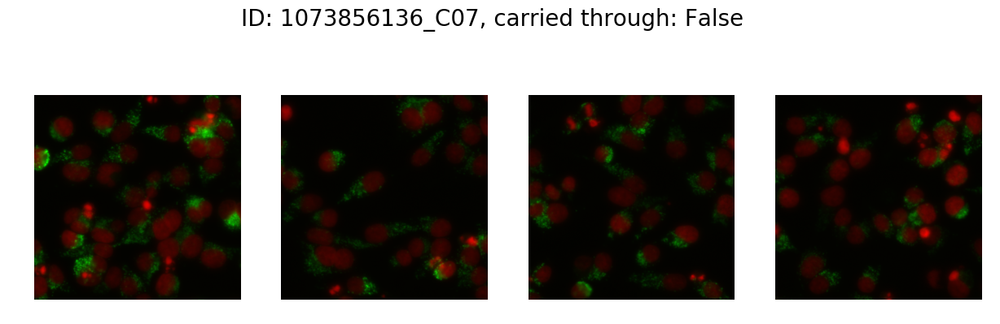

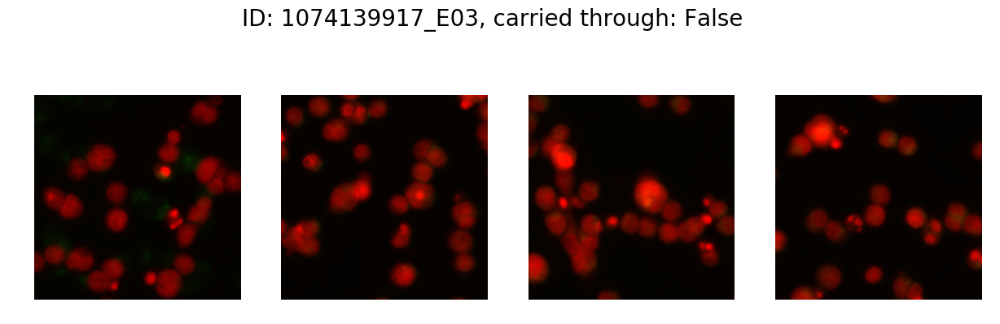

In [17]:
for ID in negative_random_choice:
    a = Assay(ID, 'processed/IXClean/')
    a.display_sections(400)

Just by observing these classes, it is evident that the two classes cannot anymore be differentiate by the mean pixel intensities on the green channel. There exist many images with high mean green pixel intensities. To confirm this intuition we re-ran the previous pixel intensity analysis.

# Mean pixel analysis on IXClean

Next we tried to see whether the same analysis was able to seperate the classes on the second, larger batch of data.

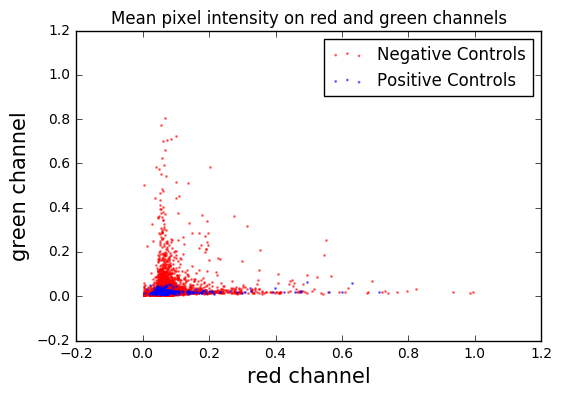

In [39]:
mean_pixel_dict_IXClean = generate_mean_pixel_intensities_for_IXClean()
display_pixel_cluster(mean_pixel_dict_IXClean)
### CLASS NOT SEPERABLE

Clearly, in the second batch of data the classes are not seperable. The data seems inconsistent with the first batch. Much of the negative class drugs reach much higher than 0.1, whereas in the previous batch, the mean pixel intensity only reached 0.02. 

For convenience, the mean pixel intensities of the control are redisplayed.

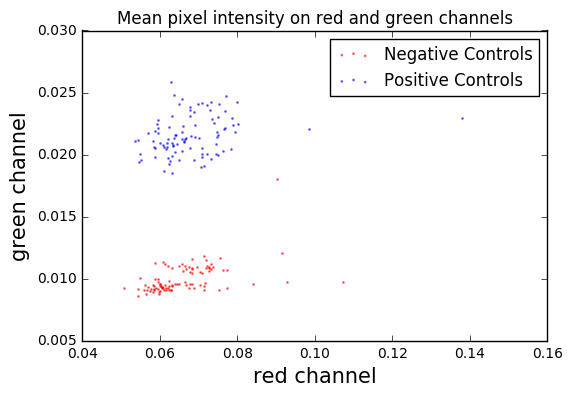

In [30]:
mean_pixel_dict_controls = generate_mean_pixel_intensities_for_controls()
display_pixel_cluster(mean_pixel_dict_controls)
# CLASSES ARE SEPERABLE

# Deep models

I investigated whether the use of deep models could better differentiate these classes. The full images were 2160x2160 pixels, much larger than are usually fed into convolutional networks. As such, assuming that the phenotype is spread homogeneously across the microscopy image, we take the central 200x200 pixels of the microscopy image.

## Load the data

In [3]:
X_train, X_test, y_train, y_test, Y_train, Y_test = load_data(1000)

## Convolutional Neural Network classifier

### Load model

In [20]:
model = generate_convolutional_model()

### Visualise model

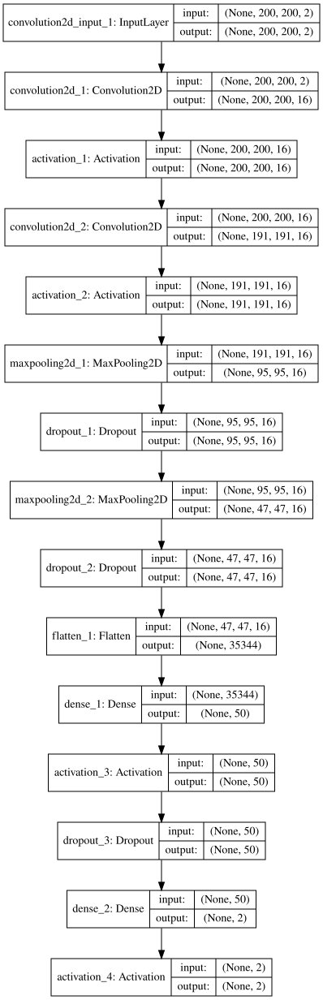

In [22]:
SVG(model_to_dot(model,show_shapes=True).create(prog='dot', format='svg'))

### Train model

In [10]:
classifier_history = model.fit(X_train, Y_train,
          batch_size=20,
          verbose=0,
          nb_epoch=50,
          validation_data=(X_test, Y_test),
          shuffle=True)

### Show results

Loss seems to steadily decrease, but validation loss increases.

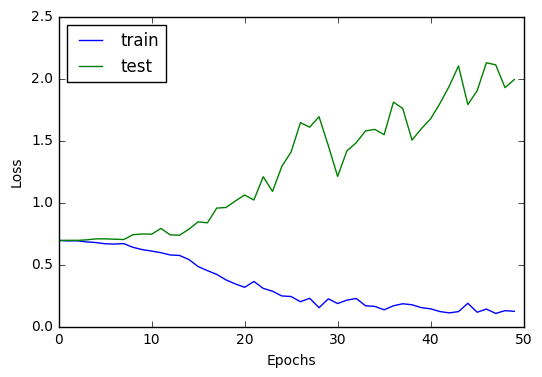

In [43]:
plt.plot(classifier_history.history['loss'], label='train')
plt.plot(classifier_history.history['val_loss'], label='test')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(loc='upper left')

Training accuracy increases but test accuracy does not rise above 0.5.

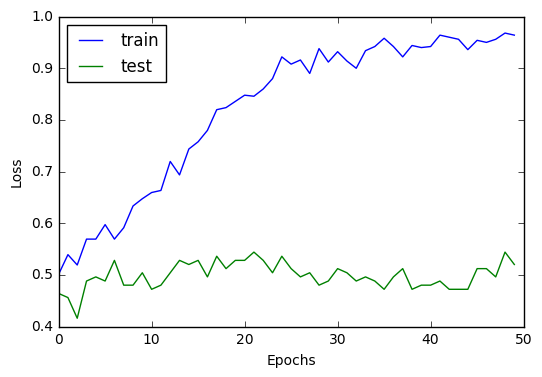

In [44]:
plt.plot(classifier_history.history['acc'], label='train')
plt.plot(classifier_history.history['val_acc'], label='test')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(loc='upper left')

## AutoEncoder Vanilla Analysis

### AutoEncode Red and Green channel

I autoencoded the images with respect to themselves. I used both channels and penalised the green channel 10x as much as the red channel.

In [31]:
autoencoder1 = generate_autoencoder1()

### Train autoencoder

In [32]:
batch_size = 32
X_train_clipped = X_train[:math.floor(len(X_train) / batch_size) * batch_size]
X_test_clipped = X_test[:math.floor(len(X_test) / batch_size) * batch_size]
autoencoder1_history = autoencoder1.fit(X_train_clipped, X_train_clipped,
                nb_epoch=50,
                verbose=0,
                batch_size=batch_size,
                shuffle=True,
                validation_data=(X_test_clipped, X_test_clipped))

### Visualize autoencoder layers

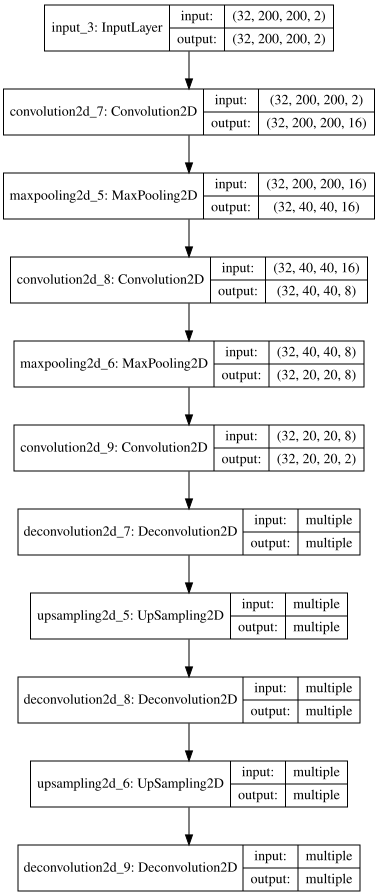

In [12]:
SVG(model_to_dot(autoencoder, show_shapes=True).create(prog='dot', format='svg'))

### View results

Both training and validation loss decrease nicely

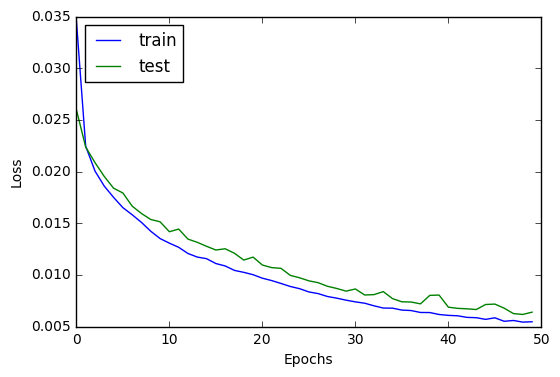

In [33]:
plt.plot(autoencoder1_history.history['loss'], label='train')
plt.plot(autoencoder1_history.history['val_loss'], label='test')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(loc='upper left')

### View decodings

The images seem to be well recovered from the encodings on both channels.

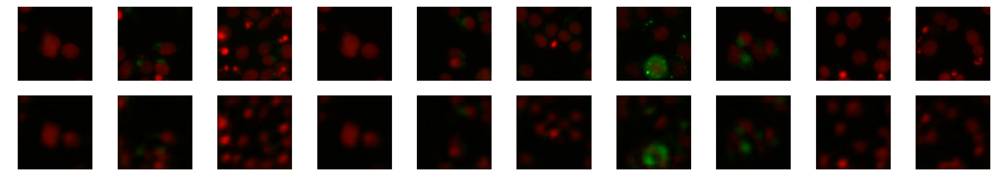

In [34]:
n = 10
idx = np.random.choice(range(len(X_test_clipped)), n)
decodings = autoencoder1.predict(X_test_clipped)
random_images = X_test[idx]
random_decodings = decodings[idx]

f,a = plt.subplots(2,n,figsize=(30,5))
for i in range(n):
    a[0][i].imshow(add_blue(random_images[i]))
    a[0][i].axis('off')
    a[1][i].imshow(multiply_with_overflow(add_blue(random_decodings[i]), factor=[1,1,1]))
    a[1][i].axis('off')

### Investigate inner layers

No obvious features found from the first convolutional layer


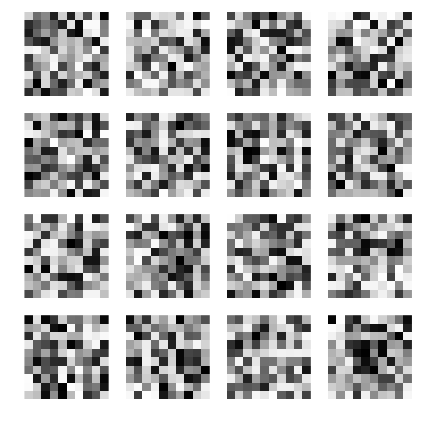

In [50]:
show_mosaic(np.array([autoencoder1.layers[1].get_weights()[0][:,:,0,:][:,:,i] for i in range(autoencoder1.layers[1].get_weights()[0].shape[-1])]), figsize=(5,5))

### Comparison with VGG inner layer weights

In [2]:
base_model = VGG19(include_top=True, weights='imagenet', input_tensor=None, input_shape=None)

On an the network pretrained with VGG however, there do seem to exist filters that caputure information.

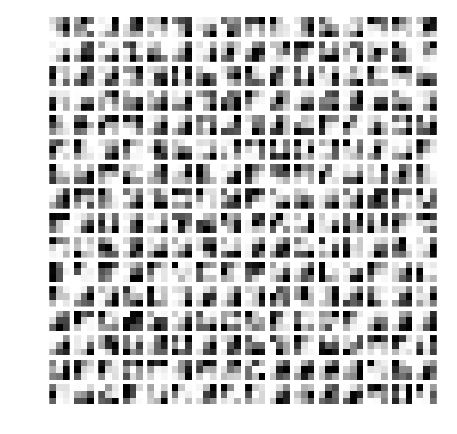

In [3]:
show_mosaic(np.array([base_model.layers[8].get_weights()[0][:,:,0][:,:,i] for i in range(base_model.layers[8].get_weights()[0].shape[-1])]),figsize=(5,5))

### Generate largest activation image VGG

Indeed, when form the image that maximises a given filter, we see that it is able to pick up on textural characteristics of the image.

In [7]:
img_list = generate_maximal_activations(base_model,1)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63


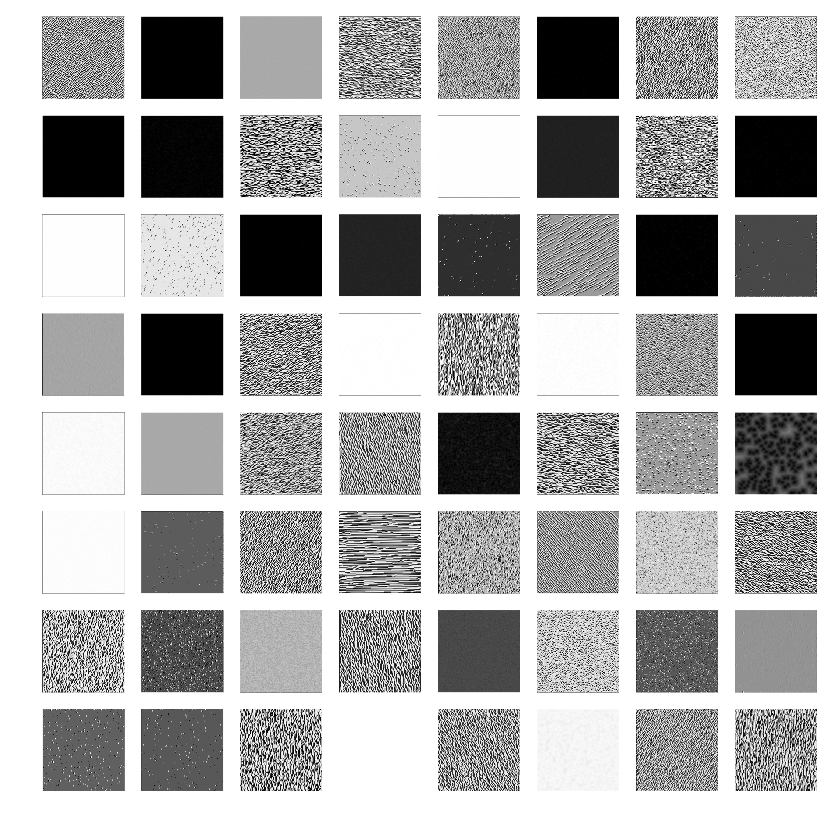

In [8]:
show_mosaic(np.array(img_list), figsize=(10,10))

### Generate layer activation with autoencoder

Textures seem to be picked up using the autoencoder, but do not obviously capture interesting things about the microscopy images.

In [9]:
img_list = generate_maximal_activations(autoencoder1,1)

NameError: name 'autoencoder1' is not defined

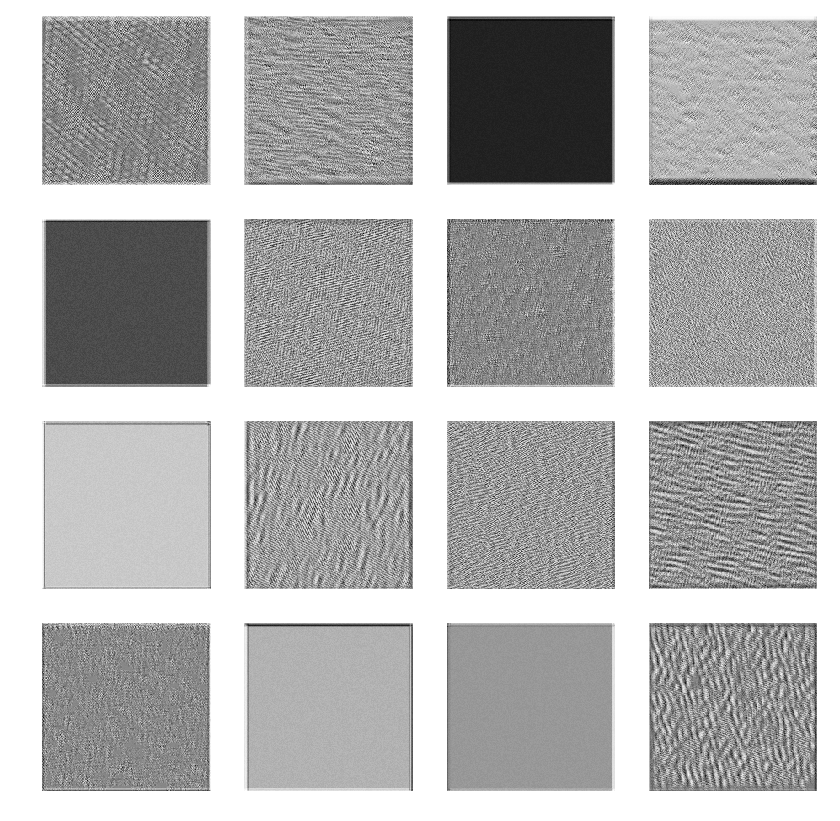

In [71]:
show_mosaic(np.array([img_list[i][0,:,:] for i in range(16)]), figsize=(10,10))

In [6]:
def generate_maximal_activations(model,layer_index):
    
    layer = model.layers[layer_index]
    img_shape = [1] + layer.get_input_at(0).get_shape().as_list()[1:]
    nb_filters = layer.get_output_at(0).get_shape().as_list()[-1]

    img_list = []
    for f in range(nb_filters):
        input_img = layer.get_input_at(0)
        layer_output = model.layers[layer_index].get_output_at(0)
        k = int(math.sqrt(nb_filters))
        loss = K.mean(layer_output[:, :, :, f])

        # compute the gradient of the input picture wrt this loss
        grads = K.gradients(loss, input_img)[0]

        # normalization trick: we normalize the gradient
        grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

        # this function returns the loss and grads given the input picture
        iterate = K.function([input_img], [loss, grads])

        # we start from a gray image with some noise
        input_img_data = np.random.random(img_shape)
        # run gradient ascent for 20 steps
        for i in range(50):
            loss_value, grads_value = iterate([input_img_data])
            input_img_data += grads_value * 10
        
        img_list.append(np.squeeze(input_img_data)[:,:,0])
        print (f)
    return img_list

### Investigate space of encoded output

In [75]:
encodings = encoder.predict(X_train[0:32])
encodings = encodings[0:10]

Investigating the space of the encodings, it seems to infact mostly find the identity mapping without any clear features.

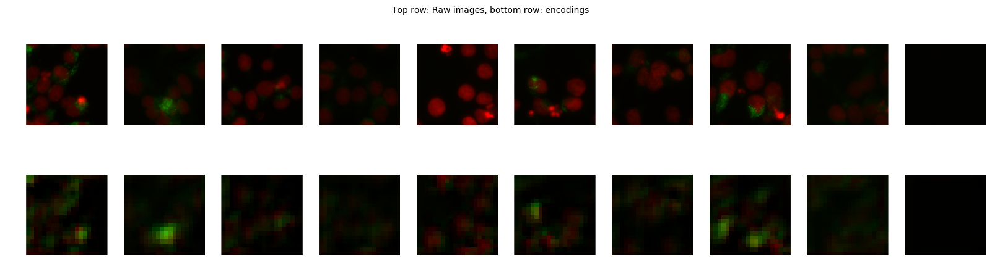

In [77]:
f, a = plt.subplots(2,10, figsize=(20,5))
for i in range(len(encodings)):
    f.suptitle('Top row: Raw images, bottom row: encodings')
    a[0][i].imshow(add_blue(X_train[i]), interpolation='none')
    a[0][i].axis('off')
    a[1][i].imshow(cv2.merge([encodings[i][:,:,0], encodings[i][:,:,1], np.zeros_like(encodings[i][:,:,0])]), interpolation='none')
    a[1][i].axis('off')

# AutoEncoder compressed to Vector

In [13]:
X_train, X_test, y_train, y_test, Y_train, Y_test = load_data(1000)

In [32]:
batch_size = 5
autoencoder2 = generate_autoencoder2(2000, batch_size)

X_train_clipped = X_train[:math.floor(len(X_train) / batch_size) * batch_size]
X_test_clipped = X_test[:math.floor(len(X_test) / batch_size) * batch_size]

autoencoder2_history = autoencoder2.fit(X_train_clipped, X_train_clipped,
                nb_epoch=50,
                verbose=2,
                batch_size=batch_size,
                shuffle=True,
                validation_data=(X_test_clipped, X_test_clipped))

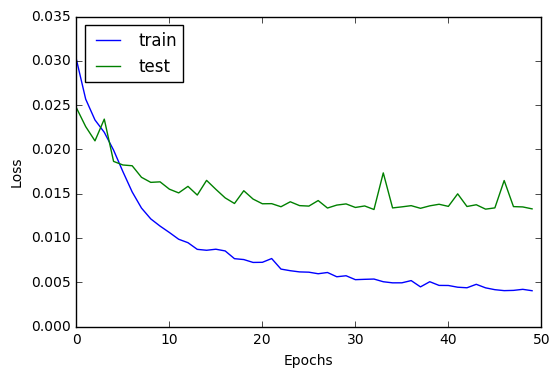

In [34]:
plt.plot(autoencoder2_history.history['loss'], label='train')
plt.plot(autoencoder2_history.history['val_loss'], label='test')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(loc='upper left')

In [22]:
img_list = generate_maximal_activations(autoencoder2,1)

Seems like no features are learning at all - this evidence suggests that there indeed in so better mapping than the identity mapping

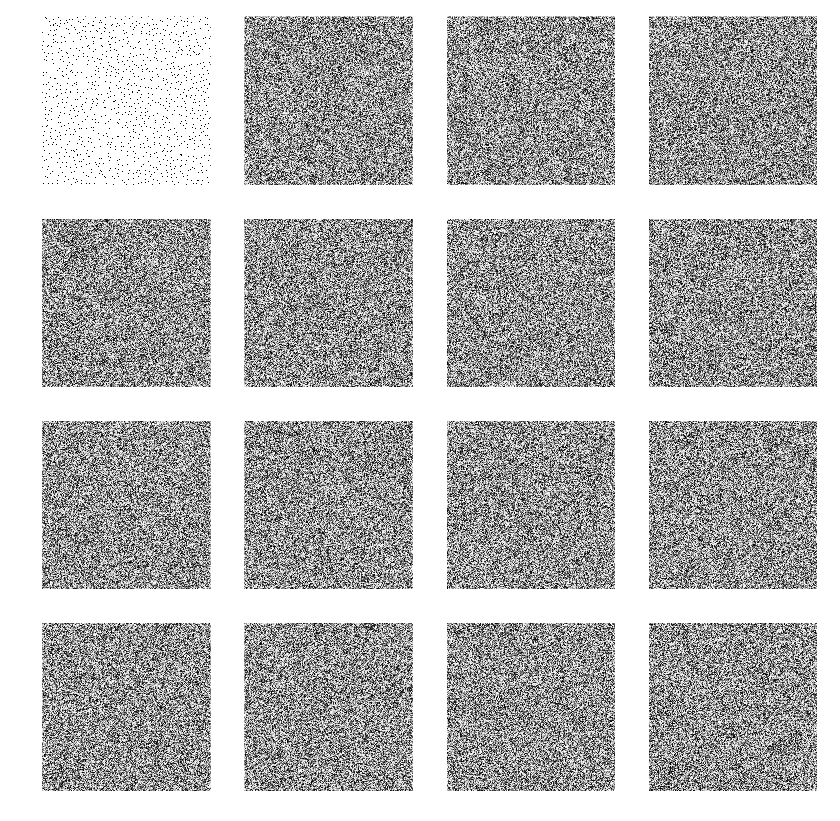

In [23]:
show_mosaic(np.array(img_list), figsize=(10,10))

Encodings loosely resemble input

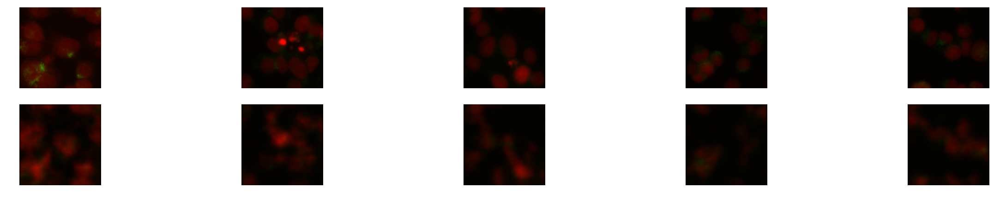

In [26]:
n = 5
decodings = autoencoder2.predict(X_test_clipped[:5])
f,a = plt.subplots(2,n,figsize=(30,5))
for i in range(n):
    a[0][i].imshow(add_blue(X_test_clipped[:5][i]))
    a[0][i].axis('off')
    a[1][i].imshow(multiply_with_overflow(add_blue(decodings[i]), factor=[1,1,1]))
    a[1][i].axis('off')

# Conclusion

* This writeup indicates that features derived from microscopy images can be autoencoded down to a compacted representation, but that features from the inner layer of the network do not yield interesting results as in other cases in machine learning.